# Chapter 4 - Data Topology and Categories

In [149]:
from __future__ import unicode_literals

from datetime import datetime
import json
from tqdm import tqdm
import re
from unicodedata import normalize
from unidecode import unidecode
from deep_translator import GoogleTranslator

import numpy as np
import pandas as pd
import os
import ast
from collections import Counter

import plotly.express as px
import pandas as pd
import plotly.subplots as sp

import numpy as np
import matplotlib.pyplot as plt
from matplotlib_venn import venn3, venn3_circles

In [128]:
search_data_dir = 'tweets/all_search_city/'
search_data_dir21 = 'tweets/all_search_city21/'
account_data_dir = 'tweets/all_account_city/'
search_files = [f for f in os.listdir(search_data_dir) if f.endswith('.csv')]
search_data_dir21 = [f for f in os.listdir(search_data_dir21) if f.endswith('.csv')]
account_files = [f for f in os.listdir(account_data_dir) if f.endswith('.csv')]

### Data Overview

#### get all basic info of account and search tweets

In [41]:
#account names and labled with city
df_city_label = pd.read_csv("city-label.csv")

In [55]:
#account tweets info
df_info_all = df_info_account.copy().groupby('city').counts.sum().reset_index()
df_info_all['Strat_account_date'] = df_info_account.groupby('city').date.min().values
df_info_all['End_account_date'] = df_info_account.groupby('city').date.max().values
df_info_all = df_info_all.rename(columns={'counts':'Collected_account_tweets_count','city':'City'})

In [56]:
# search tweets info 
counts = []
min_date = []
max_date = []

for city in df_info_all.City:
    for f in search_files21:
        if city in f:
            df_tweets = pd.read_csv(search_data_dir21+f,low_memory=False)
            df_tweets['created_at'] = pd.to_datetime(df_tweets['created_at'].map(lambda x: datetime.strptime(x[4:],'%b %d %H:%M:%S %z %Y').date()))
            counts += [len(df_tweets)] 
            min_date += [df_tweets.created_at.min()]
            max_date += [df_tweets.created_at.max()]
            
    
df_info_all['Collected_search_tweets_count'] = counts
df_info_all['Strat_search_date'] = min_date
df_info_all['End_search_date'] = max_date
df_info_all = df_info_all.merge(df_city_label, on = "City")

In [57]:
#get info from profile data
df_pf1= pd.read_csv("profile_21_accounts.csv")
df_pf1 = df_pf1[['screen_name','created_at','statuses_count','friends_count','followers_count']]
df_pf1 = df_pf1.rename(columns = {'screen_name':'Handler', 'created_at': 'Create_date', 
                         'statuses_count':'All_account_tweets_counts','friends_count':'Following_count',
                        'followers_count':'Followers_count'})
df_pf1['Create_date'] = pd.to_datetime(df_pf1['Create_date'].map(lambda x: datetime.strptime(x[4:],'%b %d %H:%M:%S %z %Y').date()))

In [58]:
#merge all infomation
df_info_all = df_info_all.merge(df_pf1, on = 'Handler')

In [62]:
df_info_all.to_csv('basic_info_search_account21.csv',index = False)

In [59]:
df_info_all

,City,Collected_account_tweets_count,Strat_account_date,End_account_date,Collected_search_tweets_count,Strat_search_date,End_search_date,Handler,Create_date,All_account_tweets_counts,Following_count,Followers_count
0,Amsterdam,3364,2019-09-12,2023-06-01,2313,2023-04-04,2023-06-01,POL_Amsterdam,2009-02-27,13461,242,398470
1,Berlin-1,3458,2018-10-03,2023-05-28,12430,2023-03-27,2023-06-01,PolizeiBerlin_E,2014-03-19,17716,21,437216
2,Berlin-2,3489,2020-12-09,2023-06-01,75244,2023-03-27,2023-06-01,polizeiberlin,2014-03-19,14454,17,556678
3,Bern,3354,2019-09-19,2023-06-01,186,2023-04-06,2023-05-31,PoliceBern,2011-01-23,11891,18,17106
4,Copenhagen,3448,2020-08-07,2023-06-01,1690,2023-04-01,2023-06-01,KobenhavnPoliti,2011-12-20,13899,75,380118
5,Helsinki,3401,2020-08-11,2023-06-01,2810,2023-04-01,2023-06-01,HelsinkiPoliisi,2013-01-09,15544,317,95271
6,Lisbon,3286,2015-08-25,2023-05-27,204,2023-04-05,2023-05-31,psplisboa,2011-01-20,11182,32,1563
7,London-1,3434,2019-11-27,2023-06-01,4695,2023-04-01,2023-06-01,CityPolice,2009-03-26,16048,555,139507
8,London-2,3633,2021-02-22,2023-06-01,210472,2023-04-01,2023-06-01,metpoliceuk,2009-08-19,33932,792,1324405
9,London-3,5177,2023-01-16,2023-06-01,10471,2023-04-01,2023-06-01,MetCC,2015-10-22,78387,100,37941


#### Accounts Timeline


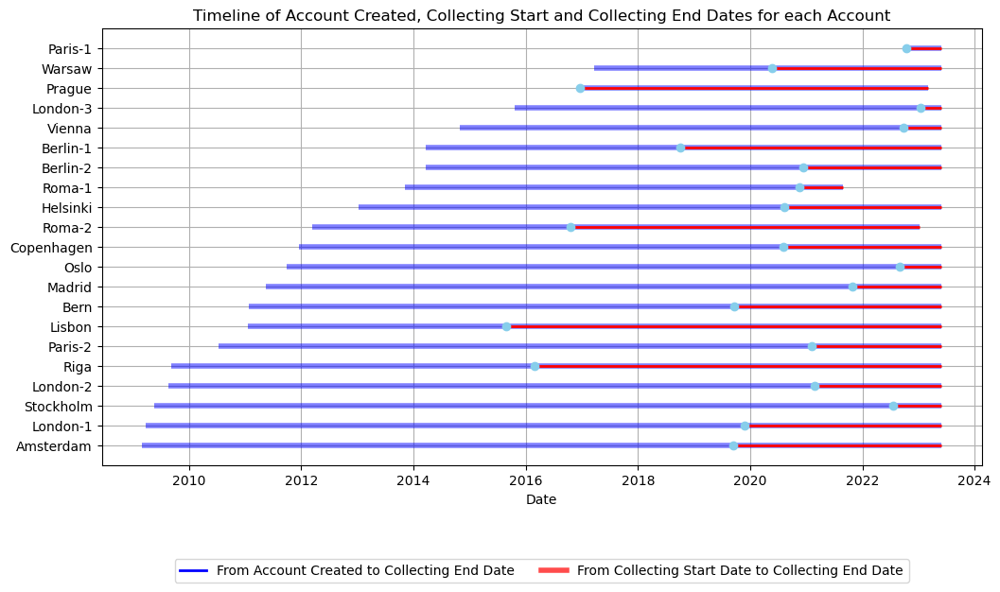

In [60]:
from matplotlib.lines import Line2D 

df = df_info_all.copy()

# convert date columns to datetime
df['Create_date'] = pd.to_datetime(df['Create_date'])
df['Strat_account_date'] = pd.to_datetime(df['Strat_account_date'])
df['End_account_date'] = pd.to_datetime(df['End_account_date'])

# Sort the dataframe by city
df = df.sort_values('Create_date')

# Set the figure size
plt.figure(figsize=(12,6))

cities = df['City'].unique()

for i, city in enumerate(cities):
    city_data = df[df['City'] == city]
    for _, row in city_data.iterrows():
        plt.hlines(y=i, xmin=row['Create_date'], xmax=row['End_account_date'], color='blue', alpha=0.5,linewidth=4)
        plt.hlines(y=i, xmin=row['Strat_account_date'], xmax=row['End_account_date'], color='red', alpha=1,linewidth=2)
        plt.plot(row['Strat_account_date'], i , "o",color='skyblue')    


# Create Line2D objects for the legend
blue_line = Line2D([0], [0], color='blue', linewidth=2, alpha=1, label='From Account Created to Collecting End Date')
red_line = Line2D([0], [0], color='red', linewidth=4, alpha=0.7, label='From Collecting Start Date to Collecting End Date')

# Add the legend to the plot
legend = plt.legend(handles=[blue_line, red_line], bbox_to_anchor=(0.5, -0.2), loc='upper center', ncol=2)

        
plt.yticks(np.arange(len(cities)), cities)
plt.xlabel('Date')
plt.title('Timeline of Account Created, Collecting Start and Collecting End Dates for each Account')
plt.grid()

plt.savefig("plots/collected_timeline_account21.png",bbox_extra_artists=[legend], bbox_inches='tight')
plt.show()


### Account tweets types

In [28]:
# get accoubt tweets types
df_tweets_structure = pd.DataFrame()
city_list = []
structue_list = []
for f in account_files:
    city = f.split('_')[0]
    city_list += [city]
    
    df_tweets = pd.read_csv(account_data_dir+f,low_memory=False)
    total = len(df_tweets)
    
    if 'retweeted_status' in df_tweets.keys(): 
        is_retweet = round(len(df_tweets[df_tweets.retweeted_status.notna()])/total*100,2)
        is_reply = round(len(df_tweets[df_tweets.retweeted_status.isna() & df_tweets.in_reply_to_status_id.notna()])/total*100,2)
        orginal = round(len(df_tweets[df_tweets.retweeted_status.isna() & df_tweets.in_reply_to_status_id.isna()])/total*100,2)
    else: 
        is_retweet = 0
        is_reply = round(len(df_tweets[df_tweets.in_reply_to_status_id.notna()])/total*100,2)
        orginal = round(len(df_tweets[df_tweets.in_reply_to_status_id.isna()])/total*100,2)
    
    structue = {'retweet':is_retweet, 'reply': is_reply, 'original' :orginal}
    structue_list += [structue]
    
df_tweets_structure['City'] = city_list
df_tweets_structure['Structure'] = structue_list


In [29]:
df_tweets_structure['original'] = df_tweets_structure.Structure.map(lambda x : x['original'])
df_tweets_structure['retweet'] = df_tweets_structure.Structure.map(lambda x : x['retweet'])
df_tweets_structure['reply'] = df_tweets_structure.Structure.map(lambda x : x['reply'])

df_tweets_structure = df_tweets_structure.sort_values('original')
df_tweets_structure = df_tweets_structure.set_index('City')


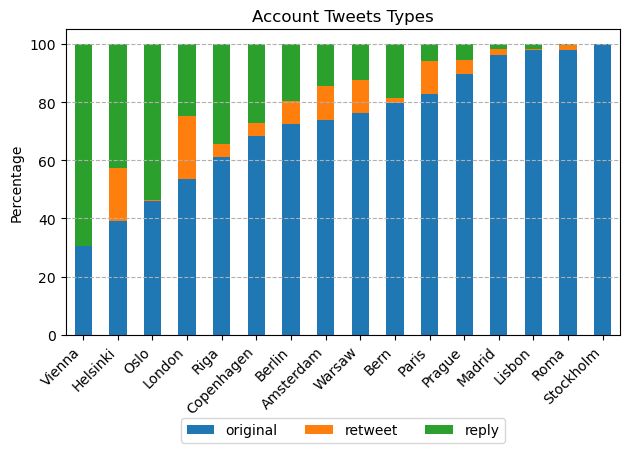

In [31]:
# plot tweets structuure
df_tweets_structure[['original', 'retweet', 'reply']].plot(kind='bar', stacked=True)

plt.title('Account Tweets Types')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Percentage')
plt.xlabel('') 
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.25), ncol=3)
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=1, zorder=1)
plt.savefig('plots/tweets_types.png', bbox_inches='tight')
plt.show()


### Followers, population, search tweets amounts

In [65]:
#merge population info to toatal info
df_info_all = pd.read_csv('basic_info_search_account21.csv')
df_population = pd.read_csv('city-population.csv')

df1 = df_info_all[['City','Followers_count','Collected_search_tweets_count']]
df2 = df_population[['City','Population']]
df_population_info = df1.merge(df2,how='left', on='City')

In [66]:
#for city has multiple accounts, only consider account has higher followers

df = df_population_info.copy() 
# Add a temporary column with the cleaned city names
df['City_Base'] = df['City'].str.split('-').str[0]

# Group by the  city names and keep the he highest follower count
df = df.sort_values('Followers_count', ascending=False).drop_duplicates('City_Base')

# Drop the temporary column
df = df.drop(columns='City_Base')

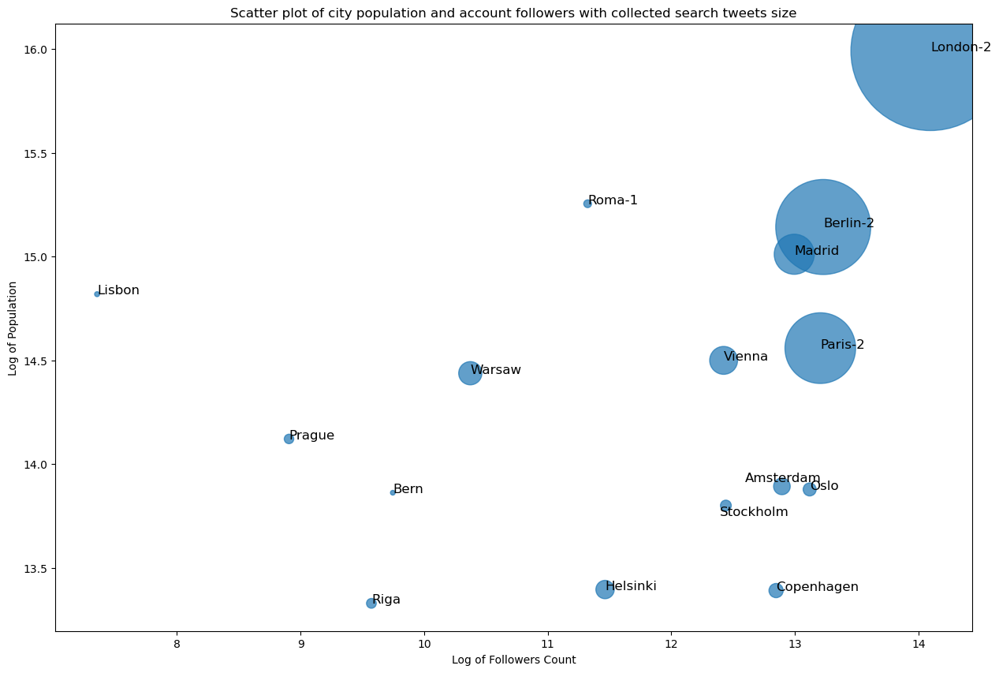

In [69]:
# Create new columns for the log of Population
df['log_Population'] = np.log(df['Population'])
df['log_Followers_count'] = np.log(df['Followers_count'])

# Create the plot
fig, ax = plt.subplots(figsize=(15,10))

# Scatter plot
scatter = ax.scatter(df['log_Followers_count'], df['log_Population'], s=df['Collected_search_tweets_count']/10, alpha=0.7)

# Add city names as labels
for i, txt in enumerate(df['City']):
    if txt == 'Amsterdam':
        ax.annotate(txt, (df['log_Followers_count'].iat[i]-0.3, df['log_Population'].iat[i]+0.01),verticalalignment='bottom', fontsize=12)
    elif txt == 'Stockholm':
        ax.annotate(txt, (df['log_Followers_count'].iat[i]-0.05, df['log_Population'].iat[i]-0.06),verticalalignment='bottom', fontsize=12)
    else: ax.annotate(txt, (df['log_Followers_count'].iat[i], df['log_Population'].iat[i]), fontsize=12)

# Adding title and labels
ax.set_title('Scatter plot of city population and account followers with collected search tweets size')
ax.set_xlabel('Log of Followers Count')
ax.set_ylabel('Log of Population')

fig.savefig('plots/follower_pop.png')

# Show the plot
plt.show()


In [99]:
df_basic_info = pd.read_csv("basic_info.csv")

In [103]:
df_plot_fVsSearch = df_basic_info[['City','followers_count','Collected_search_tweets']].groupby(['City']).sum().reset_index()

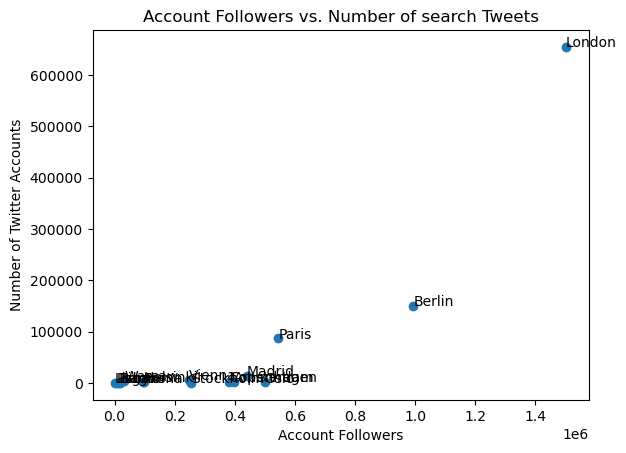

In [104]:
import matplotlib.pyplot as plt

# followers data
followers = df_plot_fVsSearch.followers_count

# Number of city Twitter accounts
twitter_accounts = df_plot_fVsSearch.Collected_search_tweets
# twitter_accounts = df_basic_info.statuses_count


# Retrieve the population and Twitter account data for each city
city_names = df_plot_fVsSearch.City


# Create a scatter plot
plt.scatter(followers, twitter_accounts)

# Add labels and title to the plot
plt.xlabel("Account Followers")
plt.ylabel("Number of Twitter Accounts")
plt.title("Account Followers vs. Number of search Tweets")

# Add city names as annotations to the plot
for i, city_name in enumerate(city_names):
    plt.annotate(city_name, (followers[i], twitter_accounts[i]))

# Display the plot
plt.show()
# --> log

# Chapter 5 - Account data analysis


## 5.1 Level of activity 

- on 21 accounts level

In [ ]:
#account names and labled with city
df_city_label = pd.read_csv("city-label.csv")

In [78]:
#get level of activity info
df_loa_all = pd.DataFrame()
city_name_dict = dict(zip(df_city_label.Handler,df_city_label.City))
for f in account_files:
    df_tweets = pd.read_csv(account_data_dir+f)
    
    df_tweets['city'] = df_tweets.user.map(lambda x: ast.literal_eval(x)['screen_name'])
    df_tweets['city'] = df_tweets.city.map(lambda x: city_name_dict[x])
    df_tweets['created_at'] = pd.to_datetime(df_tweets['created_at'].map(lambda x: datetime.strptime(x[4:],'%b %d %H:%M:%S %z %Y').date()))
    df_tweets.groupby('created_at').apply(lambda x: x.id.value_counts())
    
    df_loa = df_tweets[["created_at","id","city"]].groupby(['created_at','city']).id.count().reset_index()
    
    df_loa_all = pd.concat([df_loa_all,df_loa])


df_loa_all = df_loa_all.rename(columns={"created_at":"date","id": "counts"})
df_loa_all.to_csv('all_account_level_act21.csv',index=False)
    

In [81]:
# create df for map plot
df = df_loa_all.copy()
df['date'] = pd.to_datetime(df['date'])  # ensure the 'date' column is in datetime format

# Calculate the total post count and the active time period for each city
df_agg = df.groupby('city').agg(
    total_posts=pd.NamedAgg(column='counts', aggfunc='sum'),
    min_date=pd.NamedAgg(column='date', aggfunc='min'),
    max_date=pd.NamedAgg(column='date', aggfunc='max'),
)

df_agg['active_days'] = (df_agg['max_date'] - df_agg['min_date']).dt.days + 1  # add 1 to include both start and end date

# Calculate the average daily post count
df_agg['average_daily_tweets'] = round(df_agg['total_posts'] / df_agg['active_days'],1)

df_agg.reset_index(inplace=True)
df_agg['city-base'] = df_agg['city'].map(lambda x: x.split('-')[0])


In [82]:

df_map_plot=df_agg.groupby('city-base').average_daily_tweets.mean().reset_index() 

#define city location
cities = ["Berlin", "London", "Paris", "Roma", "Madrid", "Warsaw", "Amsterdam", "Lisbon", "Stockholm", "Vienna", "Bern", "Copenhagen", "Helsinki", "Prague", "Oslo", "Riga"]

longitudes = [13.404954, -0.127647, 2.352222, 12.496366, -3.703790, 21.012229, 4.904139, -9.139337, 18.063240, 16.373819, 7.447447, 12.568337, 24.938379, 14.437800, 10.752245, 24.105186]

latitudes = [52.520008, 51.507351, 48.856613, 41.902784, 40.416775, 52.229676, 52.370216, 38.722252, 59.329323, 48.208174, 46.948009, 55.676097, 60.169857, 50.075539, 59.913869, 56.949649]

# Create a DataFrame
df_location = pd.DataFrame({'City': cities, 'Longitude': longitudes, 'Latitude': latitudes})

In [83]:
df_map_plot = df_map_plot.merge(df_location,left_on = 'city-base',right_on='City').drop(columns='city-base')

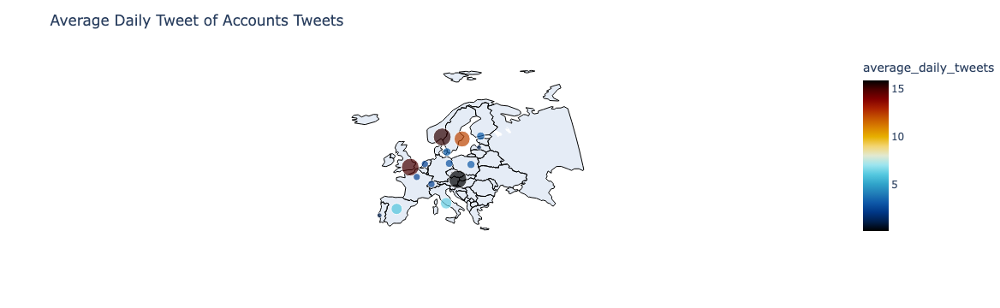

In [96]:
import plotly.io as pio

df = df_map_plot.copy()

fig = px.scatter_geo(df, lat="Latitude", lon="Longitude", 
                     color="average_daily_tweets",
                     hover_name="City",
                     projection="natural earth",
                     color_continuous_scale=px.colors.cyclical.IceFire, 
                     size="average_daily_tweets", 
                     size_max=15, 
                     scope='europe')

fig.update_geos(showcountries=True, countrycolor="Black",
                showsubunits=True, subunitcolor="Blue")



fig.update_layout(
    title_text = 'Average Daily Tweet of Accounts Tweets'
)
fig.show()
# Average Daily Twitter Posts 
pio.write_image(fig, 'dayliy_map.png')


### 2023 level of activity

In [85]:
start_date = datetime.strptime('2022,12,31','%Y,%m,%d').date()
df_loa_2023 = df_loa_all[pd.to_datetime(df_loa_all.date) > pd.to_datetime(start_date)]

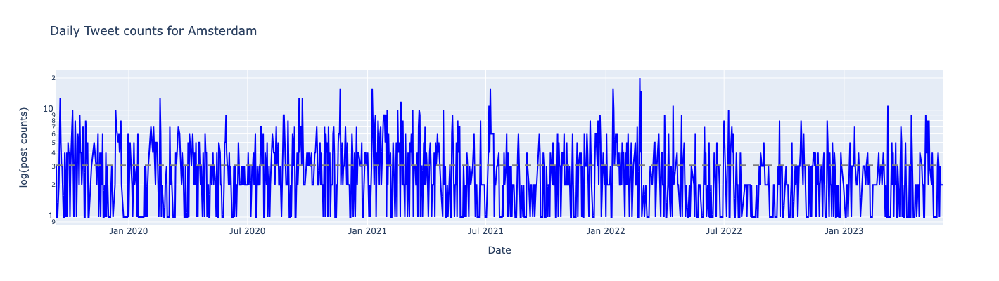

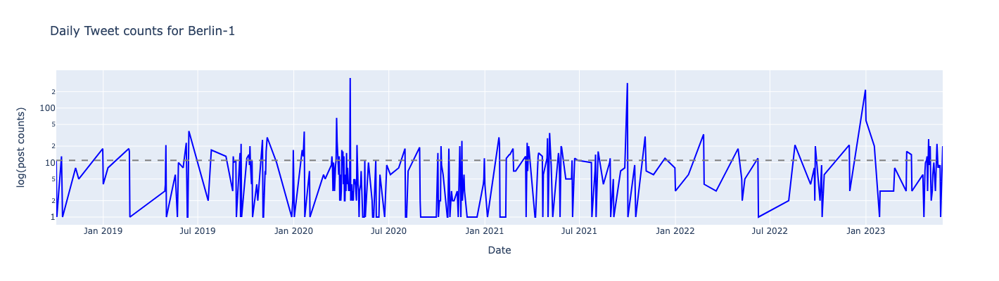

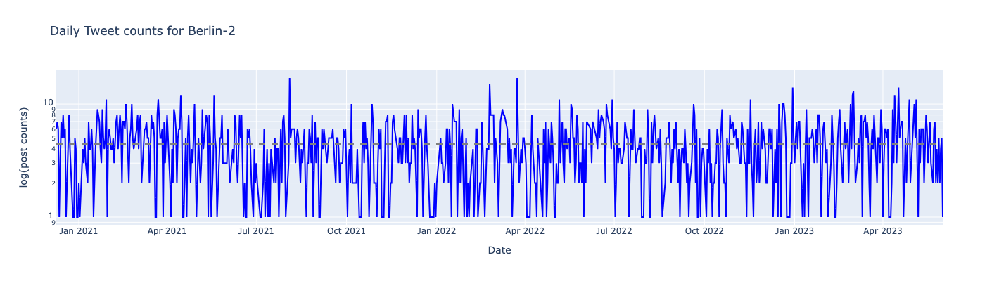

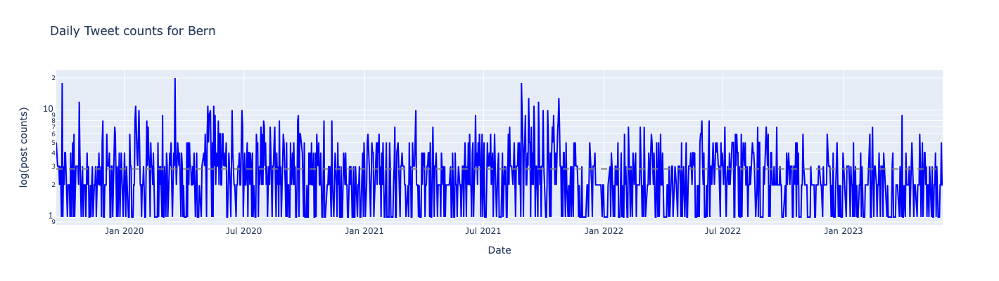

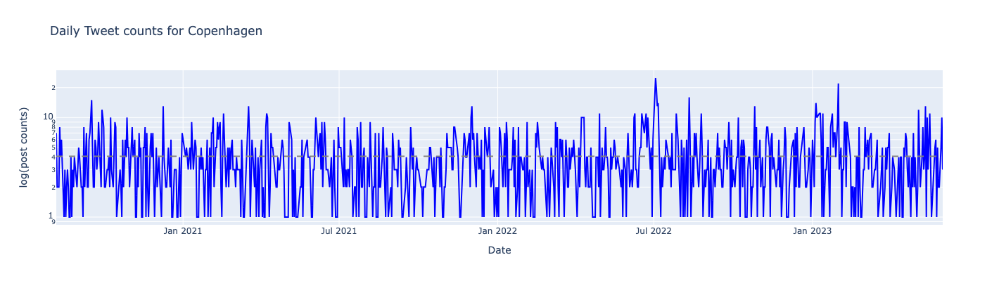

...

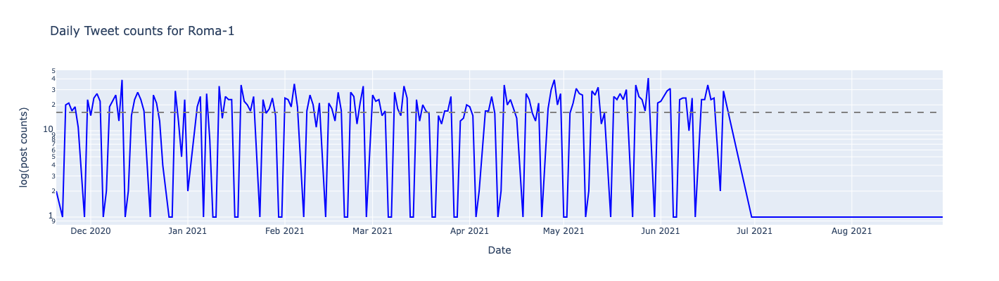

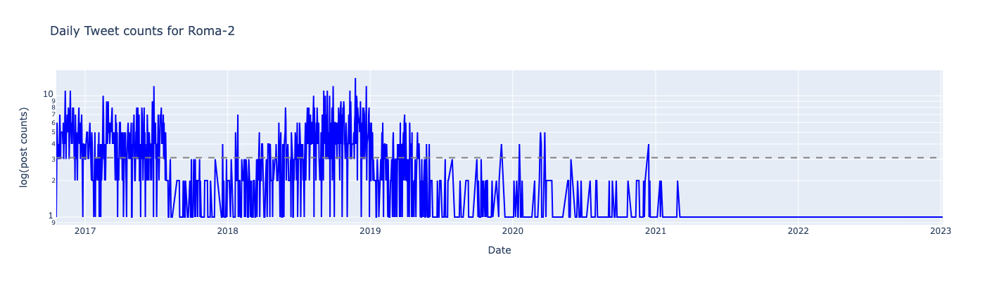

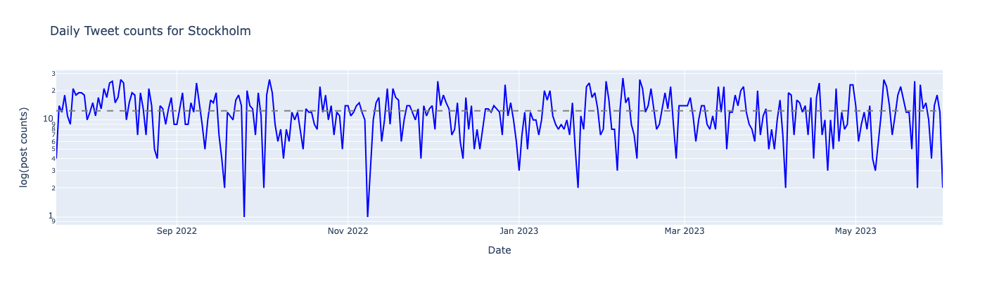

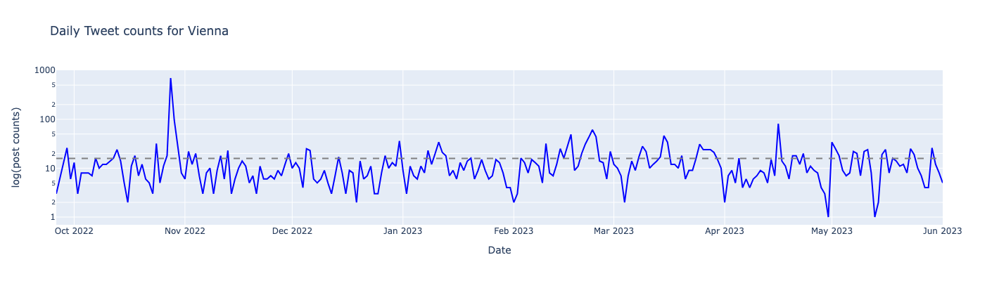

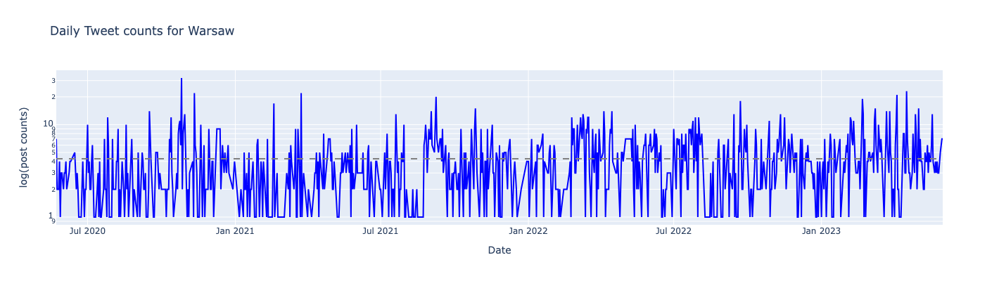

In [87]:
import plotly.graph_objs as go

#one plot for each city 
df = df_loa_all.copy()
grouped_df = df.groupby('city')

for i, (city, city_data) in enumerate(grouped_df):
    fig = go.Figure()

    # Add trace for daily post count
    fig.add_trace(
        go.Scatter(x=city_data['date'], y=city_data['counts'], mode='lines', name=city, 
                   line=dict(color='blue'))  # Add color argument here to make the color same as before
    )

    # Set the y-axis to a logarithmic scale
    fig.update_yaxes(type='log')

    avg_post_count = city_data['counts'].mean()
    
    # Add average line trace
    fig.add_trace(
        go.Scatter(x=city_data['date'], y=[avg_post_count] * len(city_data), mode='lines', 
                   name='Daily post counts',line=dict(color='gray', dash='dash'))
    )

    # Set the layout for the plot
    fig.update_layout(
        title=f'Daily Tweet counts for {city}',
        height=400,  # increase height
        width=1000,  # increase width
        showlegend=False,
        xaxis_title='Date',
        yaxis_title='log(post counts)'
    )

    fig.show()
    
    # Save the figure
    fig.write_image(f"daily/{city}_dayliy_post_count2.png")



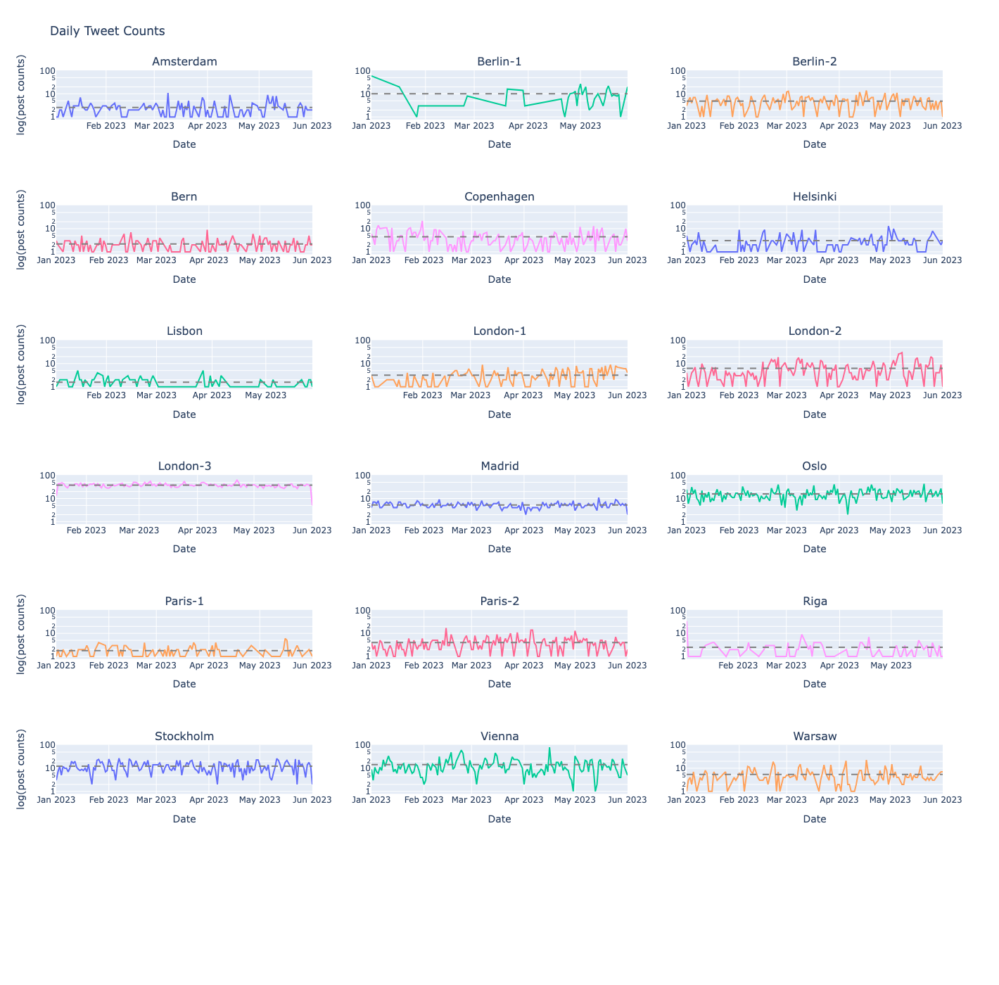

In [90]:
#all cites one plot 
# df = df_loa_all.copy()
# grouped_df = df.groupby('city')

num_row = 7
num_col = 3
fig = sp.make_subplots(rows=num_row, cols=num_col, subplot_titles=list(grouped_df.groups.keys()), vertical_spacing=0.1)


for i, (city, city_data) in enumerate(grouped_df):
    row=(i // num_col) + 1
    col=(i % num_col) + 1
    
    fig.add_trace(
        go.Scatter(x=city_data['date'], y=city_data['counts'], mode='lines', name=city),
        row=row,
        col=col
    )

    # Set the y-axis to a logarithmic scale
    fig.update_yaxes(type='log', row=row, col=col,matches='y')

    # Set the y-axis title for the leftmost subplots
    if i % 4 == 0:
        fig.update_yaxes(title_text='log(post counts)', row=row, col=1)
        
    avg_post_count = city_data['counts'].mean()
    
    # Add average line trace
    fig.add_trace(
        go.Scatter(x=city_data['date'], y=[avg_post_count] * len(city_data), mode='lines', 
                   name='Daily Tweets counts',line=dict(color='gray', dash='dash')),
        row=row,
        col=col
    )

# Set the layout for the subplots
fig.update_layout(
    title='Daily Tweet Counts',
    height=1400,
    width=1500,
    showlegend=False
)

# Set the common x-axis title for all subplots
fig.update_xaxes(title_text='Date')

# Display the subplots
fig.show()
fig.write_image("all_dayliy_tweets_count.pdf")

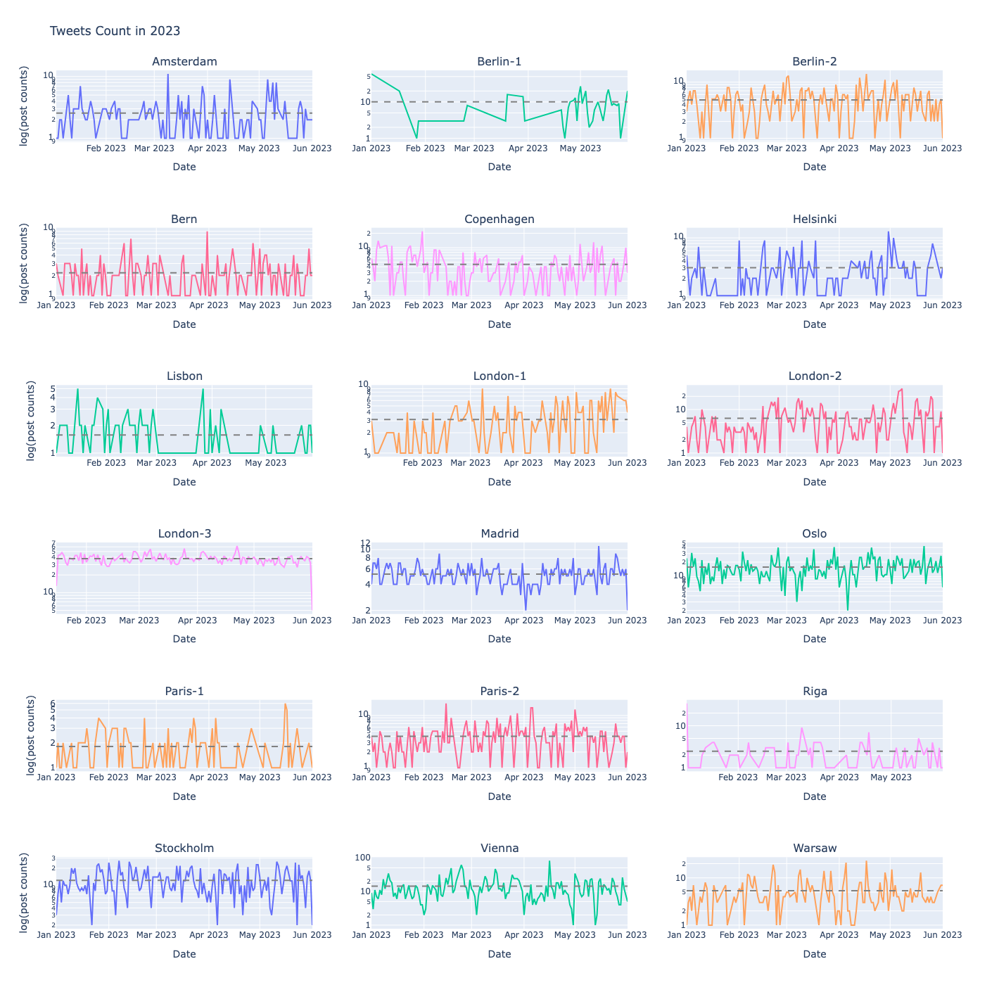

In [91]:
#all cities one plot for 2023

df = df_loa_2023.copy()
# Prague and Roma only have one post in 2023
df = df.drop(index = df[ (df.city == 'Roma-2') | (df.city == 'Prague')].index)

num_row = 6
num_col = 3
fig = sp.make_subplots(rows=num_row, cols=num_col, subplot_titles=list(grouped_df.groups.keys()), vertical_spacing=0.1)

# Iterate over each city and add a scatter trace to the corresponding subplot
grouped_df = df.groupby('city')

for i, (city, city_data) in enumerate(grouped_df):
    row=(i // num_col) + 1
    col=(i % num_col) + 1
    
    fig.add_trace(
        go.Scatter(x=city_data['date'], y=city_data['counts'], mode='lines', name=city),
        row=row,
        col=col
    )

    # Set the y-axis to a logarithmic scale
    fig.update_yaxes(type='log', row=row, col=col)

    # Set the y-axis title for the leftmost subplots
    if i % 4 == 0:
        fig.update_yaxes(title_text='log(post counts)', row=row, col=1)

    avg_post_count = city_data['counts'].mean()
    
    # Add average line trace
    fig.add_trace(
        go.Scatter(x=city_data['date'], y=[avg_post_count] * len(city_data), mode='lines', 
                   name='Daily tweets counts',line=dict(color='gray', dash='dash')),
        row=row,
        col=col
    )

# Set the layout for the subplots
fig.update_layout(
    title='Tweets Count in 2023 ',
    height=1400,
    width=1500,
    showlegend=False
)

# Set the common x-axis title for all subplots
fig.update_xaxes(title_text='Date')

# Display the subplots
fig.show()
fig.write_image("2023_tweets_count.png")

### level of activity on day of week

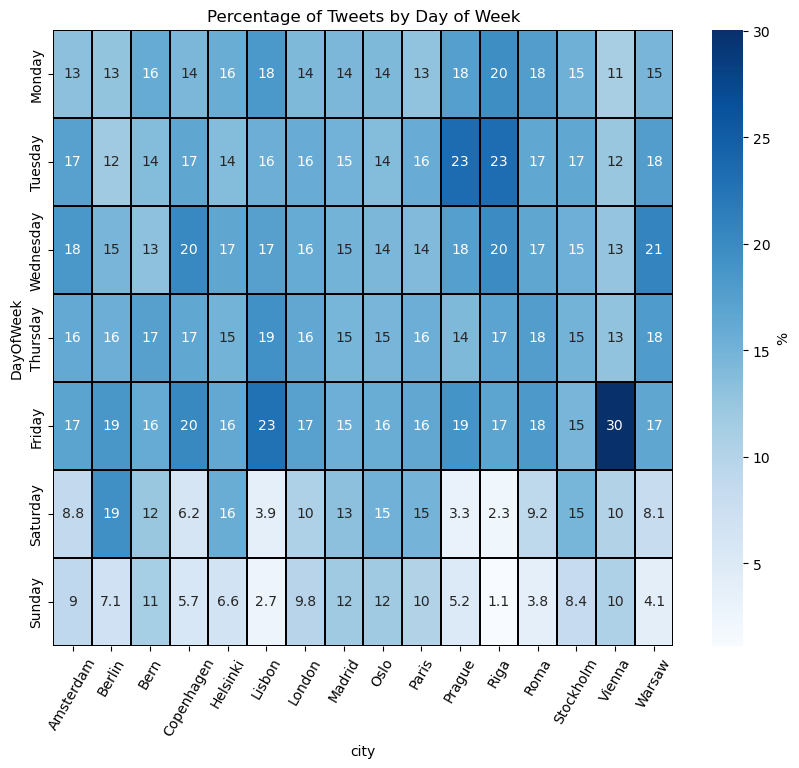

In [98]:
import seaborn as sns

df = df_loa_all.copy()
df['city'] = df['city'].map(lambda x: x.split('-')[0])
# Convert the 'Date' column to datetime type
df['date'] = pd.to_datetime(df['date'])

# Extract the day of the week
df['DayOfWeek'] = df['date'].dt.day_name()

# Group the data by City and DayOfWeek, and sum the counts
df_grouped = df.drop(columns = 'date').groupby(['city', 'DayOfWeek']).sum().reset_index()
df_grouped['percentage_post'] = df_grouped['counts'] / df_grouped.groupby('city')['counts'].transform('sum') *100
df = df_grouped.copy()



df['DayOfWeek'] = pd.Categorical(df['DayOfWeek'], categories=
    ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday', 'Sunday'],
    ordered=True)

pivot_df = df.pivot(index='DayOfWeek', columns='city', values='percentage_post')

plt.figure(figsize=(10, 8))
# sns.heatmap(pivot_df, cmap='coolwarm', annot=True, fmt=".1f")
heatmap = sns.heatmap(pivot_df, cmap='Blues', linewidths=0.3, linecolor='black',annot=True)
plt.xticks(rotation=60)

# Adjust colorbar
cbar = heatmap.collections[0].colorbar
cbar.set_label('%')

# Save the figure
plt.title('Percentage of Tweets by Day of Week')
# plt.savefig('DayOfWeek_heatmap.png')

plt.show()


### Account retweets info

Merge multiple accounts for one city

In [106]:
df_city_label.City = df_city_label.City.map(lambda x : x.split('-')[0])

In [123]:
def get_retweet_info(tweets_type,data_dir,files,df_city_label):
    df_rt_info = df_city_label.copy().groupby('City').sum().reset_index()
    rt_pre = []
    quot_pre = []
    rt_account_pre = []
    rt_acc_top20 = []
    for i in range(len(df_rt_info)):
        handler = df_rt_info.loc[i,'Handler']
        city =  df_rt_info.loc[i,'City'].split('-')[0]
        for f in files:
            if city in f:
                df_tweets = pd.read_csv(data_dir+f,low_memory=False)
                if tweets_type == 'account':
                    #filter out reply
                    df_tweets = df_tweets[df_tweets.in_reply_to_screen_name.isna()] 

                if 'retweeted_status' in  df_tweets.keys():
                    df_rt = df_tweets[df_tweets.retweeted_status.notna()]

                    # rt% from collected amount
                    rt_count = len(df_rt)
                    rt_pre += [round(rt_count/len(df_tweets) *100,2)]

                    # quote % from #rt
                    rt_quote_count = len(df_rt[df_rt.is_quote_status])
                    quot_pre += [round(rt_quote_count/rt_count *100,2)]

                    #%rt from its own account
                    df_rt_account = df_rt[df_rt.retweeted_status.map(lambda x: ast.literal_eval(x)['user']['screen_name'] in handler)]
                    rt_account_pre += [round(len(df_rt_account)/rt_count *100,2)]

                    #retweet from whom first 20 and how often                                       
                    rt_acc_all = df_rt.retweeted_status.map(lambda x: ast.literal_eval(x)['user']['screen_name'])
                    rt_acc_top20 += [dict(Counter(rt_acc_all.tolist()).most_common(20))]

                else:
                    rt_pre += [0]
                    quot_pre += [0]
                    rt_account_pre += [0]
                    rt_acc_top20 += [{}]
    df_rt_info['rt_pre'] = rt_pre
    df_rt_info['quot_pre'] = quot_pre
    df_rt_info['rt_account_pre'] = rt_account_pre
    df_rt_info['rt_acc_top20'] = rt_acc_top20
    return df_rt_info

In [131]:
df_rt_info_account = get_retweet_info("account",account_data_dir,account_files,df_city_label)
df_rt_info_search= get_retweet_info("search",search_data_dir,search_files,df_city_label)

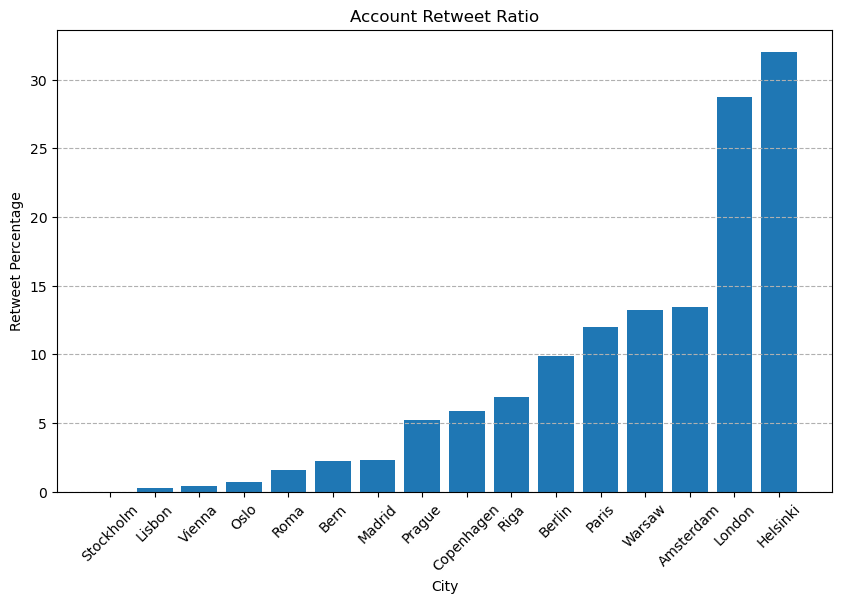

In [130]:
# Plot retweet ratio
plt.figure(figsize=(10, 6))

# Sort the DataFrame by 'rt_pre' column
df_sorted = df_rt_info_account.sort_values('rt_pre')

# Create the bar plot
plt.bar(df_sorted['City'], df_sorted['rt_pre'])

# Set the plot title and labels
plt.title('Account Retweet Ratio')
plt.xlabel('City')
plt.ylabel('Retweet Percentage')

# Rotate the x-axis labels if needed
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=1, zorder=1),
# plt.savefig('rt_ratio.png', bbox_inches='tight')
plt.show()


### Mention in accounts 

In [133]:
df_mention = df_city_label.copy().groupby('City').sum().reset_index()
mentions20 = []

for i in range(len(df_mention)):
    handler = df_mention.loc[i,'Handler']
    city =  df_mention.loc[i,'City']
    for f in account_files:
        if city in f:
            df_tweets = pd.read_csv(account_data_dir+f,low_memory=False)
            
            user_mentions = df_tweets.entities.map(lambda x: [mention['screen_name'] for mention in ast.literal_eval(x)['user_mentions']])
            user_mention_list = [item for sublist in user_mentions.tolist() for item in sublist]
            mentions20 += [dict(Counter(user_mention_list).most_common(20))]
df_mention['mentions_account_top20'] = mentions20
# df_mention.to_csv('account_search_mention_info.csv',index = False)

### Reply in accounts tweets

In [137]:
df_reply = df_city_label.copy().groupby('City').sum().reset_index()
reply3 = []
reply_all = []

for i in range(len(df_reply)):
    handler = df_reply.loc[i,'Handler']
    city =  df_reply.loc[i,'City']
    for f in account_files:
        if city in f:
            df_tweets = pd.read_csv(account_data_dir+f,low_memory=False)
            
            lst = df_tweets.dropna(subset=['in_reply_to_screen_name']).in_reply_to_screen_name.values.tolist()
            counter = Counter(lst)

            # Convert the Counter object to a dictionary
            dict_counter = dict(counter)

            # Sort the dictionary by value in descending order and take the first 3 items
            top_3_items = sorted(dict_counter.items(), key=lambda x: x[1], reverse=True)[:3]
            # all_items = sorted(dict_counter.items(), key=lambda x: x[1], reverse=True)
            total = sum(dict_counter.values())
            percentage_dict = {key: round((value / total) * 100,2) for key, value in dict_counter.items()}

            # Convert the list of tuples back to a dictionary
            top_3_dict = dict(top_3_items)
            # all_items_dict = dict(all_items)
            reply_all += [percentage_dict]
            reply3 += [top_3_dict]
            
df_reply['Top3_reply_accounts'] = reply3
df_reply['Reply_accounts'] = reply_all

In [138]:
all_handlers = ','.join(df_reply.Handler.tolist())+'PSPCOMETLIS'
df_reply['reply_itself%'] = df_reply.Reply_accounts.map(lambda x:sum([ x[name] for name in x.keys() if name in all_handlers]) )


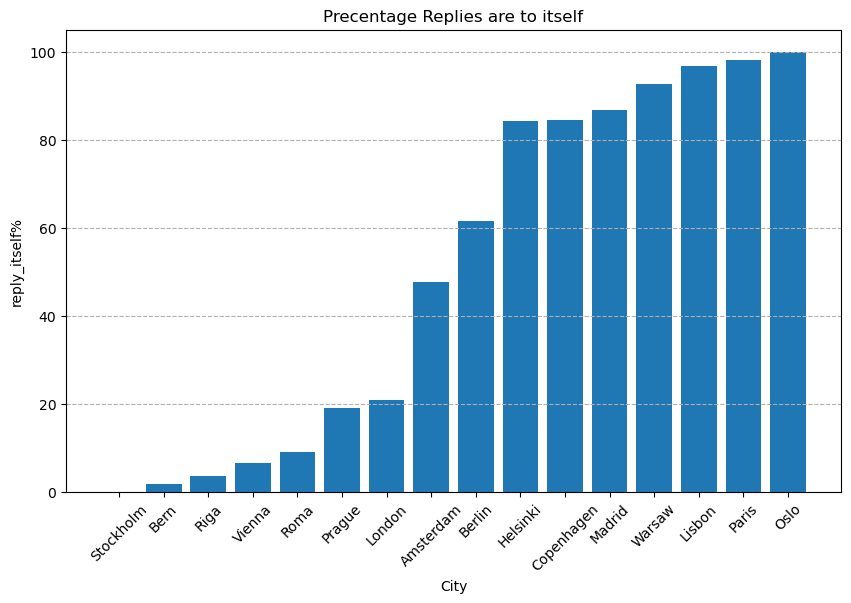

In [139]:
df = df_reply.sort_values('reply_itself%')
plt.figure(figsize=(10,6))
plt.bar(df['City'], df['reply_itself%'], width=0.8)
plt.xticks(rotation=45)
# Add labels and title
plt.xlabel('City')
plt.ylabel('reply_itself%')
plt.title('Precentage Replies are to itself')
plt.grid(axis='y', linestyle='--', alpha=1, zorder=1),
plt.savefig('in_paper/rely_itself.png', bbox_inches='tight')
# Show the plot
plt.show()

## 5.3 Resource sharing

In [140]:
def get_types_counter(my_column):

    # Initialize an empty dictionary
    frequency_dict = {}

    # Iterate over the column
    for cell_value in my_column:
            frequency_dict[cell_value] = frequency_dict.get(cell_value, 0) + 1

    return frequency_dict

In [141]:
df_url_media = pd.DataFrame()

city_list = []
media_type_list = []
url_pre = []
media_pre = [] 
have_resource = []
for f in account_files:
    city = f.split('_')[0]
    
    df_tweets = pd.read_csv(account_data_dir+f,low_memory=False)
    #excule reply and rt
    df_tweets = df_tweets[df_tweets.in_reply_to_status_id.isna()]
    if 'retweeted_status' in df_tweets.keys():
        df_tweets = df_tweets[df_tweets.retweeted_status.isna()] 
        
    df_tweets['has_url'] = df_tweets.entities.map(lambda x : len(ast.literal_eval(x)['urls'])>0)
    df_tweets['media_types'] = [() for i in range(len(df_tweets))]

    if 'extended_entities' in df_tweets.keys():
        df_tweets['has_media'] = df_tweets.extended_entities.notna()
        extend_entities_index = df_tweets[df_tweets.extended_entities.notna()].index
        df_tweets.loc[extend_entities_index,'media_types'] = df_tweets.loc[extend_entities_index,'extended_entities'].map(lambda x: set([m['type'] for m in ast.literal_eval(x)['media']]))
        df_tweets.loc[extend_entities_index,'media_types'] = df_tweets.loc[extend_entities_index,'media_types'].map(lambda x: tuple(x))
    else: df_tweets['has_media'] = False
    
    url_index = df_tweets[df_tweets['has_url']].index    
    df_tweets.loc[url_index,'media_types'] = df_tweets[df_tweets['has_url']].media_types.map(lambda x: x+('url',) )
    df_tweets.media_types  =  df_tweets.media_types.map(lambda x: np.nan if len(x)==0 else x )
    types_list = df_tweets.media_types.values

    media_type = get_types_counter(types_list)

    media_type_list  += [media_type]
    city_list += [city] 
    
    total = len(df_tweets)
    url_count = len(df_tweets[df_tweets.has_url])
    media_count = len(df_tweets[df_tweets.has_media])
    have_both = len(df_tweets[df_tweets.has_media | df_tweets.has_url])
    url_pre += [url_count/total]
    media_pre += [media_count/total]
    have_resource += [have_both/total]
    
df_url_media['City'] = city_list
df_url_media['Media_types'] = media_type_list
df_url_media['Url%'] = url_pre
df_url_media['Media%'] = media_pre
df_url_media['Resorce_share%'] = have_resource
    

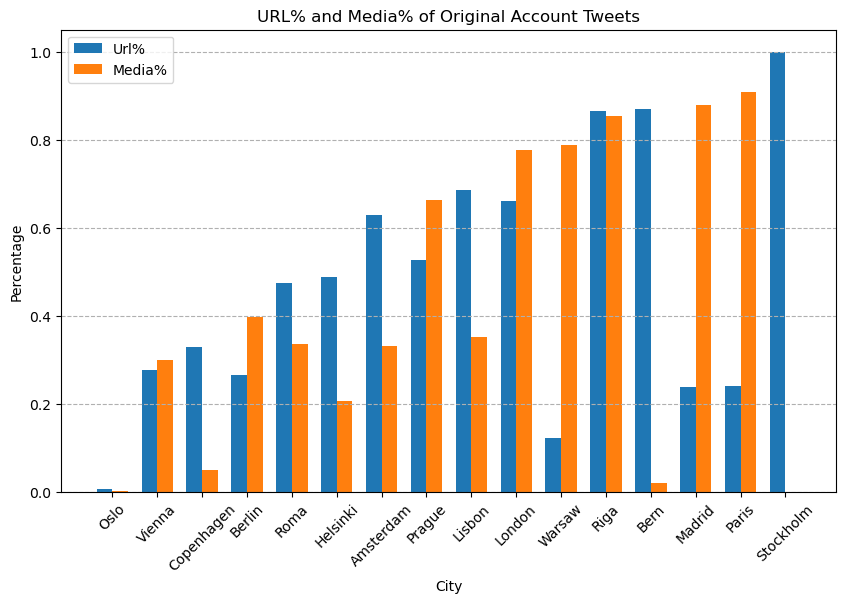

In [145]:
#plot url% media%
df = df_url_media.copy()

df['Max'] = df[['Url%', 'Media%']].max(axis=1)

# Sort the DataFrame based on the "Max" column in descending order
df = df.sort_values('Max', ascending=True)

# Remove the "Max" column if not needed anymore
df.drop('Max', axis=1, inplace=True)

bar_width = 0.35

# Create an array for x-axis positions
x = np.arange(len(df["City"]))

# Plotting the data
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
plt.bar(x - bar_width/2, df["Url%"], width=bar_width, label="Url%")
plt.bar(x + bar_width/2, df["Media%"], width=bar_width, label="Media%")
plt.xlabel("City")
plt.ylabel("Percentage")
plt.title("URL% and Media% of Original Account Tweets")
plt.legend()

# Rotate x-axis labels by 45 degrees
plt.xticks(x, df["City"], rotation=45)
# plt.grid()
plt.grid(axis='y', linestyle='--', alpha=1, zorder=1)
# plt.savefig("url_media_pre.png", bbox_inches='tight')
plt.show()

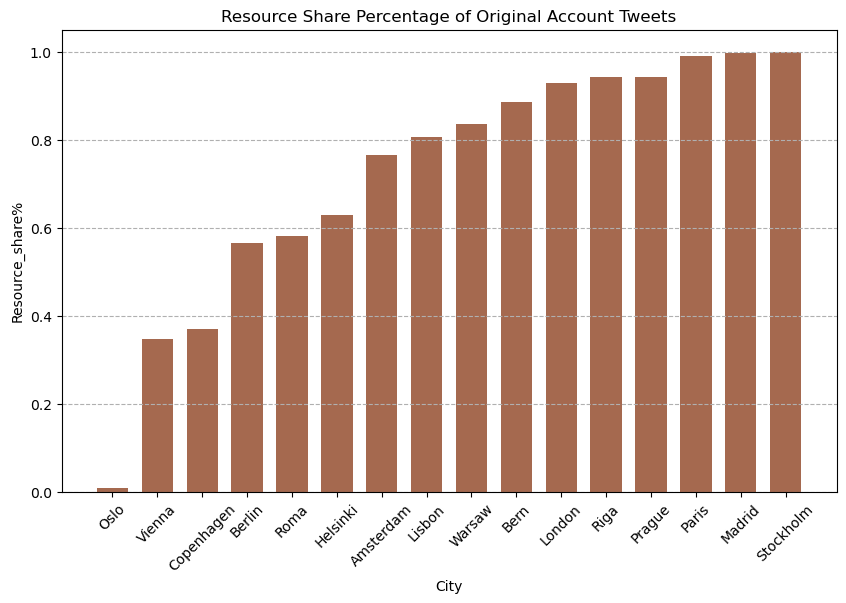

In [146]:
#plot resource sharing percentage
plt.figure(figsize=(10, 6))

# Set the RGB color
color = (165/255, 105/255, 79/255)
df = df_url_media.sort_values('Resorce_share%').copy()
# Plot the bar chart
plt.grid(axis='y', linestyle='--', alpha=1, zorder=1)
plt.bar(df['City'], df['Resorce_share%'], color=color, width = 0.7)

# Rotate x-axis labels by 45 degrees
plt.xticks(rotation=45)

# Set labels and title
plt.xlabel('City')
plt.ylabel('Resource_share%')
plt.title('Resource Share Percentage of Original Account Tweets')

plt.savefig("resource_share_pre.png", bbox_inches='tight')
# Show the plot
plt.show()


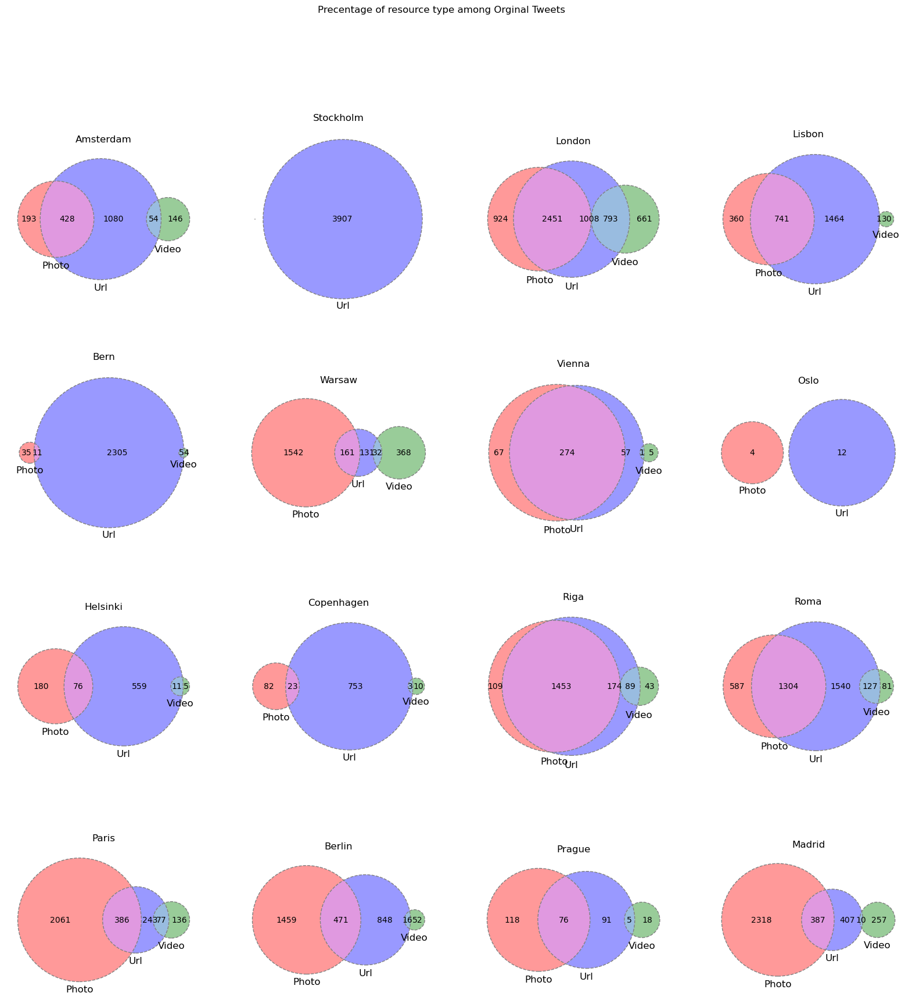

In [238]:
#plot resource type precentage in each city account
fig, axs = plt.subplots(4, 4, figsize=(20, 20)) # Create a 4x4 subplots grid
axs = axs.ravel() # Flatten the array for easy iterating

for i in range(len(df_url_media)):
    city = df_url_media.City[i]
    data_pre = df_url_media.Media_types_pre[i]
    data = df_url_media.Media_types[i]

    order_sets = [('photo',),('video',),('video','photo'),('url',),('photo', 'url'),('video', 'url'),('video', 'url','photo')]

    tuple_values = ()
    for key in order_sets: 
        tuple_values += (data_pre.get(key, 0),)
        
    if city == 'Stockholm':
        venn = venn3(subsets = tuple_values, set_labels = (' ',' ','Url'), ax=axs[i])
    elif city == 'Oslo':
        venn = venn3(subsets = tuple_values, set_labels = ('Photo',' ','Url'), ax=axs[i])        
    else: 
        venn = venn3(subsets = tuple_values, set_labels = ('Photo','Video','Url'), ax=axs[i])
        
    c = venn3_circles(subsets = tuple_values, linestyle='dashed', linewidth=1, color="grey", ax=axs[i])

    # Add the "types_number" values as text
    if data.get(order_sets[0], 0) > 0: venn.get_label_by_id('100').set_text(str(data.get(order_sets[0], 0)))
    if data.get(order_sets[1], 0) > 0: venn.get_label_by_id('010').set_text(str(data.get(order_sets[1], 0)))
    if data.get(order_sets[3], 0) > 0: venn.get_label_by_id('001').set_text(str(data.get(order_sets[3], 0)))
    if data.get(order_sets[4], 0) > 0: venn.get_label_by_id('101').set_text(str(data.get(order_sets[4], 0)))
    if data.get(order_sets[5], 0) > 0: venn.get_label_by_id('011').set_text(str(data.get(order_sets[5], 0)))

    axs[i].set_title(city)
    
fig.suptitle("Precentage of resource type among Orginal Tweets")

# Save the entire figure
plt.savefig('all_cities_media_euler.png')
plt.show()


In [185]:
# engagement level based on reseouce share
df_likes = pd.DataFrame()

city_list = []

have_only_link_per = []
have_only_media_per  = [] 
have_both_per  = []
have_none_per  = []

have_only_link_mean = []
have_only_media_mean = [] 
have_both_mean = []
have_none_mean  = []

for f in account_files:
    city = f.split('_')[0]
    city_list += [city] 
    
    df_tweets = pd.read_csv(account_data_dir+f,low_memory=False)
    #excule reply and rt
    df_tweets = df_tweets[df_tweets.in_reply_to_status_id.isna()]
    if 'retweeted_status' in df_tweets.keys():
        df_tweets = df_tweets[df_tweets.retweeted_status.isna()] 
        
    df_tweets['has_url'] = df_tweets.entities.map(lambda x : len(ast.literal_eval(x)['urls'])>0)
    df_tweets['media_types'] = [() for i in range(len(df_tweets))]

    if 'extended_entities' in df_tweets.keys():
        df_tweets['has_media'] = df_tweets.extended_entities.notna()
        extend_entities_index = df_tweets[df_tweets.extended_entities.notna()].index
        df_tweets.loc[extend_entities_index,'media_types'] = df_tweets.loc[extend_entities_index,'extended_entities'].map(lambda x: set([m['type'] for m in ast.literal_eval(x)['media']]))
        df_tweets.loc[extend_entities_index,'media_types'] = df_tweets.loc[extend_entities_index,'media_types'].map(lambda x: tuple(x))
    else: df_tweets['has_media'] = False
    
    
    df_tweets['has_only_url'] = (df_tweets['has_url']== True) & (df_tweets['has_media']==False)
    df_tweets['has_only_media'] = (df_tweets['has_media']== True) & (df_tweets['has_url']==False)
    df_tweets['has_both'] =  (df_tweets['has_media']== True) & (df_tweets['has_url']==True)
    df_tweets['has_none'] = (df_tweets['has_media']== False) & (df_tweets['has_url']==False)
    
    df_tweets["rt/likes_count"] = df_tweets['retweet_count']+ df_tweets['favorite_count']
    
    total = df_tweets["rt/likes_count"].sum()
    only_link_per = round(df_tweets[df_tweets['has_only_url'] == True]['rt/likes_count'].sum()/total,2)
    only_media_per = round(df_tweets[df_tweets['has_only_media'] == True]['rt/likes_count'].sum()/total,2)
    both_per = round(df_tweets[df_tweets['has_both'] == True]['rt/likes_count'].sum()/total,2)
    
    
    only_link_mean = df_tweets[df_tweets['has_only_url'] == True]['rt/likes_count'].mean()
    only_media = df_tweets[df_tweets['has_only_media'] == True]['rt/likes_count'].mean()
    both_mean = df_tweets[df_tweets['has_both'] == True]['rt/likes_count'].mean()
    none_mean = df_tweets[df_tweets['has_none'] == True]['rt/likes_count'].mean()
    
    
    have_only_link_per += [only_link_per]
    have_only_media_per  += [only_media_per] 
    have_both_per  += [both_per]
    have_none_per  += [1-(only_link_per+only_media_per+both_per)]

    have_only_link_mean += [only_link_mean]
    have_only_media_mean += [only_media] 
    have_both_mean += [both_mean]
    have_none_mean  += [none_mean]
    
df_likes['City'] = city_list
df_likes['rt/likes_onlyUrl_per'] = have_only_link_per
df_likes['rt/likes_onlyMedia_per'] = have_only_media_per
df_likes['rt/likes_both_per'] = have_both_per
df_likes['rt/likes_none_per'] = have_none_per

df_likes['rt/likes_onlyUrl_mean'] = have_only_link_mean
df_likes['rt/likes_onlyMedia_mean'] = have_only_media_mean
df_likes['rt/likes_both_mean'] = have_both_mean
df_likes['rt/likes_none_mean'] = have_none_mean

df_likes = df_likes.fillna(0)

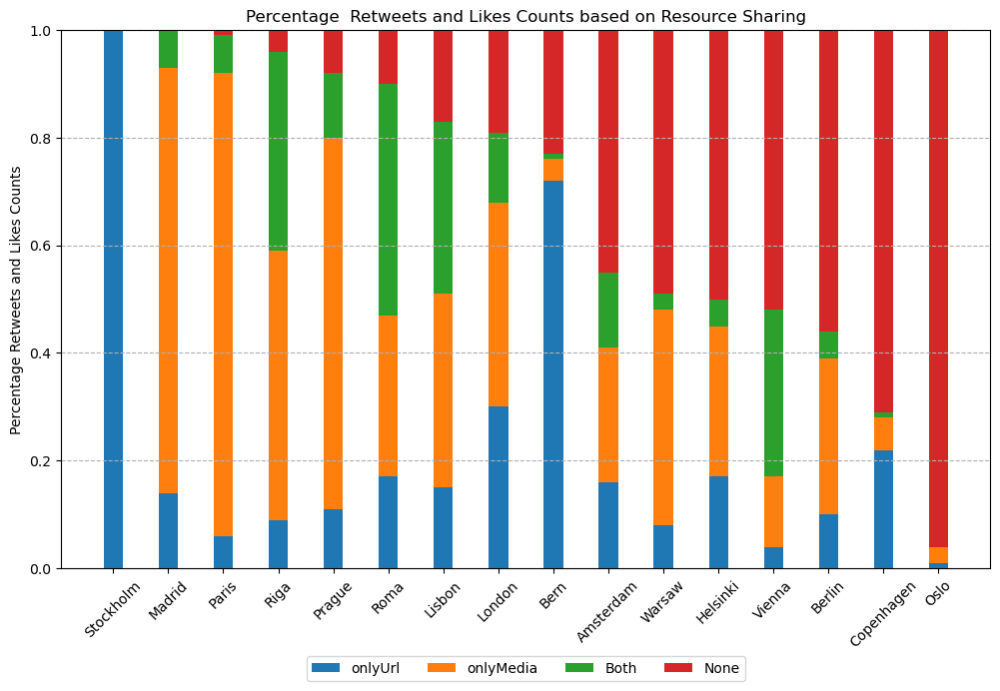

In [186]:
# plot recource types with egangement level percentage
df = df_likes.copy()
df = df.sort_values("rt/likes_none_per")

# Create an array for x-axis positions
x = np.arange(len(df["City"]))

# Plotting the data
plt.figure(figsize=(12, 7))  # Optional: Adjust the figure size
bar1 = plt.bar(x, df["rt/likes_onlyUrl_per"], width=bar_width, label="onlyUrl")
bar2 = plt.bar(x, df["rt/likes_onlyMedia_per"], width=bar_width, label="onlyMedia", bottom=df["rt/likes_onlyUrl_per"])
bar3 = plt.bar(x, df["rt/likes_both_per"], width=bar_width, label="Both", bottom=df["rt/likes_onlyUrl_per"] + df["rt/likes_onlyMedia_per"])
bar4 = plt.bar(x, df["rt/likes_none_per"], width=bar_width, label="None", bottom=df["rt/likes_onlyUrl_per"] + df["rt/likes_onlyMedia_per"] + df["rt/likes_both_per"])

# plt.xlabel("City")
plt.ylabel("Percentage Retweets and Likes Counts")
plt.title("Percentage  Retweets and Likes Counts based on Resource Sharing")

# Rotate x-axis labels by 45 degrees
plt.xticks(x, df["City"], rotation=45)

plt.grid(axis='y', linestyle='--', alpha=1, zorder=1)

# Move legend below the plot
plt.legend(bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=4)

# plt.savefig("avg_likes_whole.png", bbox_inches='tight')  # Add bbox_inches='tight' to fit the legend in the figure while saving
plt.show()

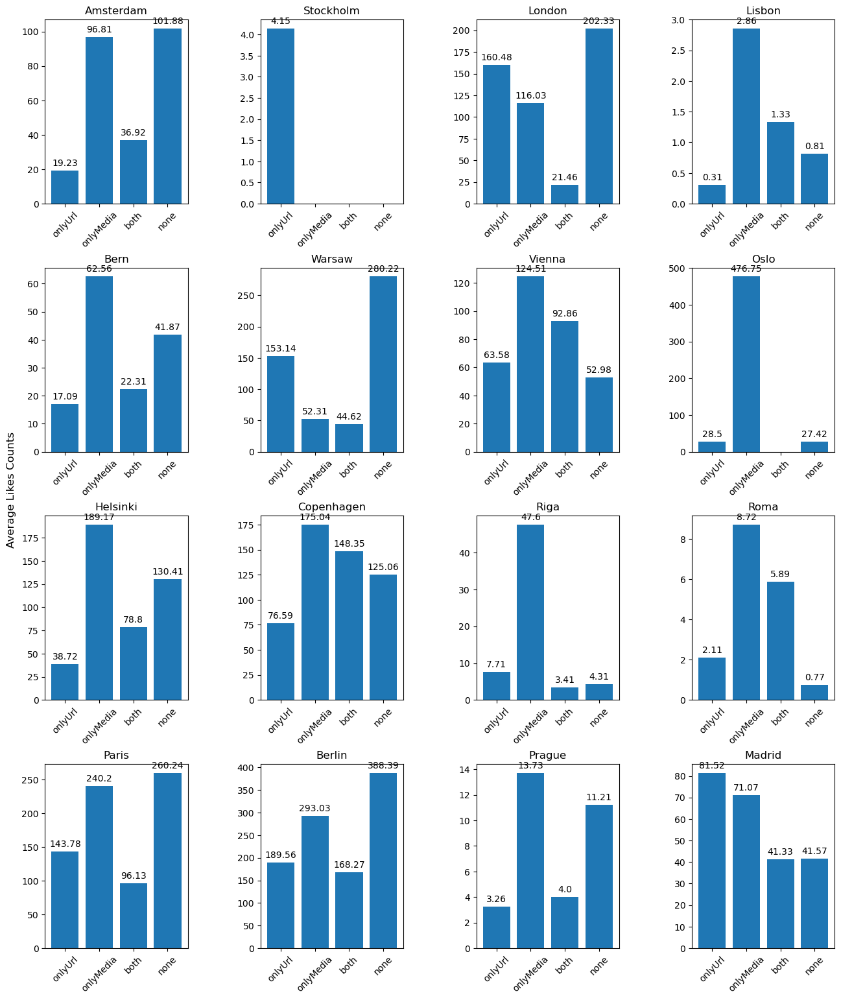

In [196]:
df = df_likes.copy()

# Set the types
types = ['onlyUrl', 'onlyMedia', 'both', 'none']
types_colums = ['rt/likes_onlyUrl_mean', 'rt/likes_onlyMedia_mean',
       'rt/likes_both_mean', 'rt/likes_none_mean']

# Get the unique cities
cities = df['City'].unique()

# Determine the number of rows and columns for subplots
num_rows = 4
num_cols = 4

# Calculate the figsize based on the number of rows and subplot height
figsize = (14, num_rows * 4)  # Adjusting the height based on num_rows

# Create subplots with adjusted height
fig, axs = plt.subplots(num_rows, num_cols, figsize=figsize)
fig.tight_layout(pad=5.0)

# Set the y-axis title on the side with adjusted position
fig.text(0.03, 0.5, 'Average Likes Counts', va='center', rotation='vertical',fontsize=12)

# Iterate over cities and plot subplots
for i, city in enumerate(cities):
    # Get the data for the current city
    city_data = df[df['City'] == city]
    
    # Determine the subplot position
    row = i // num_cols
    col = i % num_cols
    
    # Select the subplot
    ax = axs[row, col] if num_rows > 1 else axs[col]
    
    # Plot the average likes counts using a logarithmic scale
    bars = ax.bar(types, city_data[types_colums].values[0])
    
    # Set the title and labels
    ax.set_title(city)
    ax.tick_params(axis='x', labelrotation = 45) # rotate x axis labels
    
    # Display actual count above each bar if it's not zero
    for bar in bars:
        height = bar.get_height()
        count = round(height,2)
        if count != 0:
            ax.annotate(f'{count}', xy=(bar.get_x() + bar.get_width() / 2, height),
                        xytext=(0, 3), textcoords='offset points',
                        ha='center', va='bottom')

# Show the plot
# plt.grid()
# plt.xlabel('Types')
plt.savefig("avg_likes_eachcity.png")
# plt.show()


# Chapter 6 - Account and Search Tweets analysis

### 6.1 language

In [203]:
def get_lang_info(data_type,files,data_dir,df_info):
    df_lang = df_info.copy().groupby('City').sum().reset_index()
    special_lang= ['und','qam','qct','qht','qme','qst','zxx','art']
    # https://www.exportdata.io/blog/advanced-twitter-search-operators/#:~:text=lang%3Aqme%20%2D%20for%20tweets%20with,2022%2D06%2D14%60

    lang_all = []
    lang_natural_sorted = []
    lang_natural_sorted3 = []

    lang_natural_rt = []
    langue_quote = []


    for i in range(len(df_lang)):
        city =  df_lang.loc[i,'City']
        for f in files:
            if city in f:
                df_tweets = pd.read_csv(data_dir+f,low_memory=False)

                if 'retweeted_status' in  df_tweets.keys():
                    df_rt = df_tweets[df_tweets.retweeted_status.notna()]
                    lang_rt_list = df_rt.retweeted_status.map(lambda x: ast.literal_eval(x)['lang']).tolist()
                    lang_natural_rt_list = [lang for lang in lang_rt_list if lang not in special_lang]
                    lang_natural_rt_list = [lang for lang in lang_natural_rt_list if lang not in special_lang]
                    lang_natural_rt += [dict(Counter(lang_natural_rt_list))]
                else: 
                    lang_natural_rt += [{}]

                if 'quoted_status' in  df_tweets.keys():    

                    df_quote = df_tweets[df_tweets.quoted_status.notna()]
                    langue_quote_list = df_quote.lang.tolist()
                    langue_quote_list = [lang for lang in langue_quote_list if lang not in special_lang]
                    langue_origQuote_list = df_quote.quoted_status.map(lambda x: ast.literal_eval(x)['lang']).tolist()
                    langue_origQuote_list = [lang for lang in langue_origQuote_list if lang not in special_lang]


                    langue_quote += [dict(Counter(zip(langue_quote_list,langue_origQuote_list)))]

                else: 
                    langue_quote += [{}]

                lang_all_list = df_tweets.lang.tolist()
                lang_natural_list = [lang for lang in lang_all_list if lang not in special_lang]

                lang_all += [dict(Counter(lang_all_list))]
                lang_natural_sorted3 += [dict(sorted(Counter(lang_natural_list).items(), key=lambda item: item[1], reverse=True)[:3])]
                lang_natural_sorted += [dict(sorted(Counter(lang_natural_list).items(), key=lambda item: item[1], reverse=True))]

    df_lang['lang_all'] = lang_all
    df_lang['lang_natural_top3'] = lang_natural_sorted3
    df_lang['lang_natural_sorted'] = lang_natural_sorted
    

    df_lang['lang_natural_rt'] = lang_natural_rt
    df_lang['(quote_text,orig_text)'] = langue_quote
    # df_lang.to_csv('lang_'+data_type+'_info.csv',index = False)
    
    return df_lang


In [204]:
df_lang_search = get_lang_info('search',search_files,search_data_dir,df_city_label)
df_lang_account = get_lang_info('account',account_files,account_data_dir,df_city_label)

In [205]:
df_lang_account = df_lang_account.rename(columns = {"lang_natural_top3": "Top3 account lang"})
df_lang_search = df_lang_search.rename(columns = {"lang_natural_top3": "Top3 search lang"})

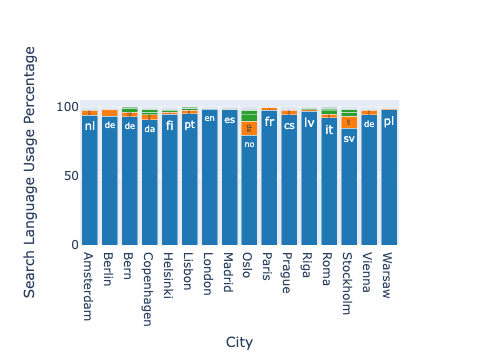

In [209]:
df = df_lang_search.copy()[['City','lang_natural_sorted']].rename(columns={'City':'city','lang_natural_sorted':'lang'})

df['lang'] = df['lang'].apply(lambda x: {k: round(v / sum(x.values()) * 100,2) for k, v in x.items()})

# Calculate rank based on language percentage for each city
df['rank'] = df['lang'].apply(lambda x: {k: rank+1 for rank, (k, v) in enumerate(sorted(x.items(), key=lambda item: -item[1]))})

# Determine the maximum rank across all cities
max_rank = max(df['rank'].apply(lambda x: max(x.values())))

# Create a list of colors based on the maximum rank
colors = ['rgb(31, 119, 180)', 'rgb(255, 127, 14)', 'rgb(44, 160, 44)', 'rgb(214, 39, 40)']


# Create the stacked bar chart
data = []
for i, row in df.iterrows():
    lang_usage = row['lang']
    rank = row['rank']
    x = [row['city']]
    y = [lang_usage[lang] for lang in lang_usage]
    base = [0] * len(lang_usage)

    for j, (lang, percentage) in enumerate(lang_usage.items()):
        hover_text = f"{x[0]}:<br>{percentage:.2f}% {lang}"
        if rank[lang] < 3:
            data.append(go.Bar(x=x, y=[y[j]] , 
                               marker_color=colors[rank[lang] - 1], 
                               text=lang,
                               textposition='auto',
                               hovertemplate=hover_text,
                               name=lang))
        else:
            # hover_text = f"{city}:<br>{percentage:.2f}% {lang}"
            data.append(go.Bar(x=x, y=[y[j]] , 
                                 marker_color=colors[2],
                                 hovertemplate=hover_text,
                                 name=lang))
              # base[j] += percentage

layout = go.Layout(
    barmode='stack',
    showlegend=False,
    xaxis=dict(title='City'),
    yaxis=dict(title='Search Language Usage Percentage')
)


fig = go.Figure(data=data, layout=layout)
# fig.write_image("lang_search.png")
fig.show()


### 6.2. Hashtag

In [223]:
def get_hashtags_info(types,files,data_dir,df_city_label):
    df_hashtags = df_city_label.copy().groupby('City').sum().reset_index()
    
    hashtags_all = []
    percentage = []
    for i in range(len(df_hashtags)):
        city =  df_hashtags.loc[i,'City']
        for f in files:
            if city in f:
                df_tweets = pd.read_csv(data_dir+f,low_memory=False)
                df_tweets['has_hashtag'] = df_tweets.entities.map(lambda x: len(ast.literal_eval(x)['hashtags'])>0)
                percentage += [round((df_tweets['has_hashtag'].sum() / df_tweets['has_hashtag'].count()) * 100,2)]

                hashtags = df_tweets.entities.map(lambda x: [hashtags['text'] for hashtags in ast.literal_eval(x)['hashtags']])
                # --> lowercase + normalize
                hashtags_list = [unidecode(item.lower()) for sublist in hashtags.tolist() for item in sublist]
                hashtags_all += [dict(Counter(hashtags_list))]

    df_hashtags['hashtag_pre_'+types]  = percentage 
    df_hashtags['all_hashtags_'+types] = hashtags_all
    df_hashtags['number_of_hashtags_'+types] = df_hashtags['all_hashtags_'+types].map(lambda x: len(x))
    
    return df_hashtags

In [224]:
df_hashtags_account  = get_hashtags_info('account',account_files,account_data_dir,df_city_label)
df_hashtags_search  = get_hashtags_info('search',search_files,search_data_dir,df_city_label)
df_hashtags = df_hashtags_account.merge(df_hashtags_search,on='City')

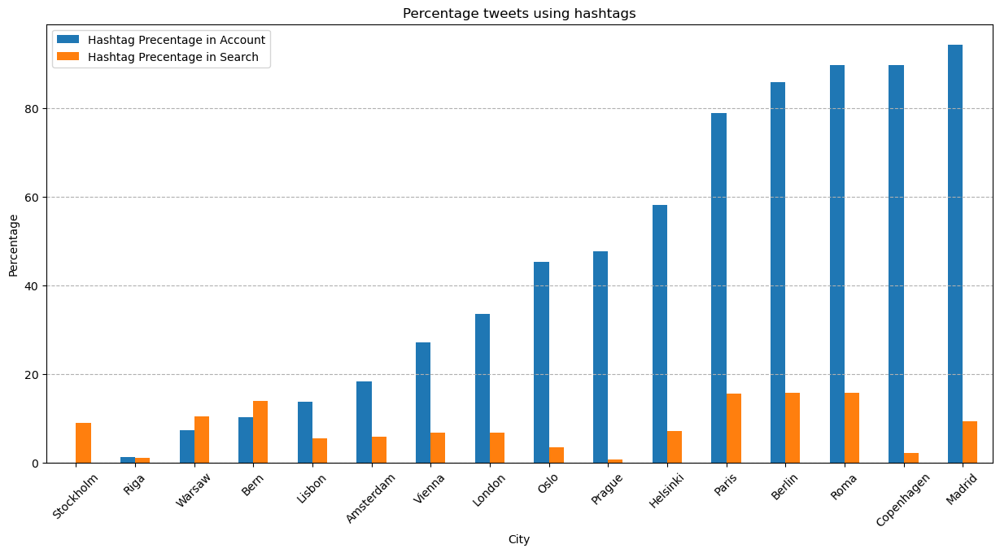

In [225]:
#plot percentage using hashtags
df = df_hashtags.copy()
df.sort_values('hashtag_pre_account',inplace=True)
df.set_index('City', inplace=True)

df[['hashtag_pre_account', 'hashtag_pre_search']].plot(kind='bar', stacked=False, figsize=(15,7))

plt.title('Percentage tweets using hashtags')
plt.xlabel('City')
plt.ylabel('Percentage')
plt.legend(['Hashtag Precentage in Account', 'Hashtag Precentage in Search'])
plt.xticks(rotation=45) 

plt.grid(axis='y', linestyle='--', alpha=1, zorder=1),
plt.savefig('hashtag_precentage.png', dpi=300, bbox_inches='tight')
plt.show()

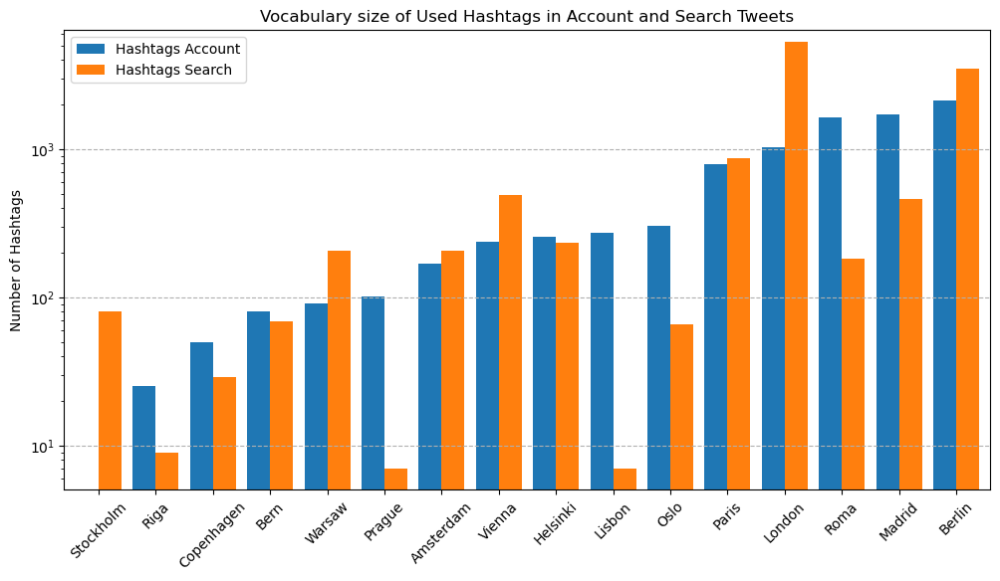

In [237]:
#plot vocabulary size
df = df_hashtags[['City','number_of_hashtags_account', 'number_of_hashtags_search']].sort_values('number_of_hashtags_account')

# df.sort_values('number_of_hashtags_account')
# Setting the positions and width for the bars
pos = list(range(len(df['City']))) 
width = 0.4 

# Plotting the bars
fig, ax = plt.subplots(figsize=(12,6))

# Create a bar with 'number_of_hashtags_account' data,
# in position pos,
plt.bar(pos, 
        df['number_of_hashtags_account'], 
        width, 
        # alpha=0.7, 
        # color='#EE3224', 
        label=df['City'][0]) 

# Create a bar with 'number_of_hashtags_search' data,
# in position pos + width,
plt.bar([p + width for p in pos], 
        df['number_of_hashtags_search'],
        width, 
        # alpha=0.7, 
        # color='#F78F1E', 
        label=df['City'][1]) 

# Set the y axis label
ax.set_ylabel('Number of Hashtags')

# Set the chart's title
ax.set_title('Vocabulary size of Used Hashtags in Account and Search Tweets')

# Set the position of the x ticks
ax.set_xticks([p + 0.5 * width for p in pos])

# Set the labels for the x ticks
ax.set_xticklabels(df['City'], rotation=45)

plt.yscale('log')

# Setting the x-axis and y-axis limits
plt.xlim(min(pos)-width, max(pos)+width*2)
plt.ylim([0, max(df['number_of_hashtags_account'] + df['number_of_hashtags_search'])] )

# Adding the legend and showing the plot
plt.legend(['Hashtags Account', 'Hashtags Search'], loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=1, zorder=1),
plt.savefig('hashtag_vocab.png', dpi=300, bbox_inches='tight')
plt.show()


### word cloud of hashtags

In [228]:
# order city based on the pattern
cities_order = [
    "Berlin",
    "Vienna",
    "Amsterdam",
    "Paris",
    "Prague",
    "Riga",
    "London",
    "Madrid",
    "Oslo",
    "Roma",
    "Helsinki",
    "Bern",
    "Lisbon",
    "Warsaw",
    "Copenhagen",
    "Stockholm"
]

In [229]:
df_hashtags1 = df_hashtags.copy()
df_hashtags1 = df_hashtags1.set_index('City')
df_hashtags1 = df_hashtags1.reindex(cities_order).reset_index()

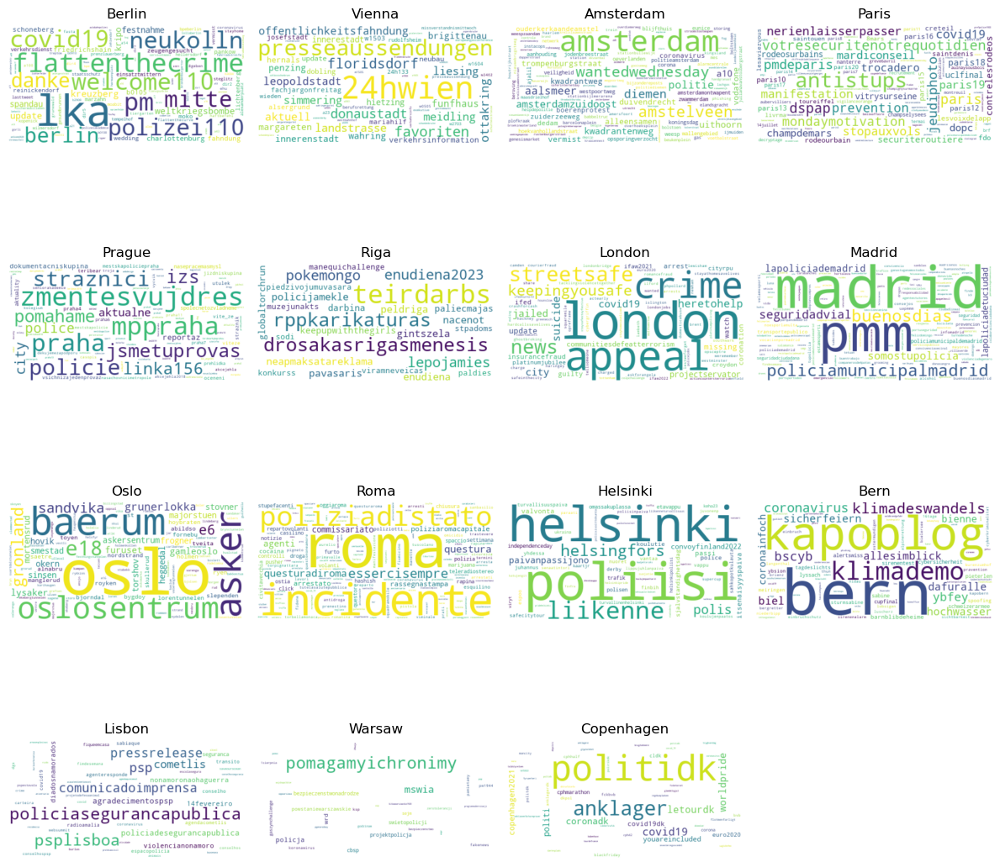

In [230]:
# plot wordcloud for account
from wordcloud import WordCloud

fig, axs = plt.subplots(4, 4, figsize=(12, 12), subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axs.flat):
    if i >= len(df_hashtags1):
        break
    
    city = df_hashtags1.loc[i, 'City']
    word_counts = df_hashtags1.all_hashtags_account[i]
    
    if len(word_counts) == 0:
        # ax.set_title(city)
        ax.set_visible(False)
    else:
        # Generate word cloud
        wordcloud = WordCloud(background_color='white').generate_from_frequencies(word_counts)

        # Plot the word cloud
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.axis("off")
        ax.set_title(city)

plt.tight_layout()
plt.imshow(wordcloud, interpolation="bilinear")
# Save the figure
plt.savefig('hashtags_word_cloud_account2.png')

# Show the plot
plt.show()




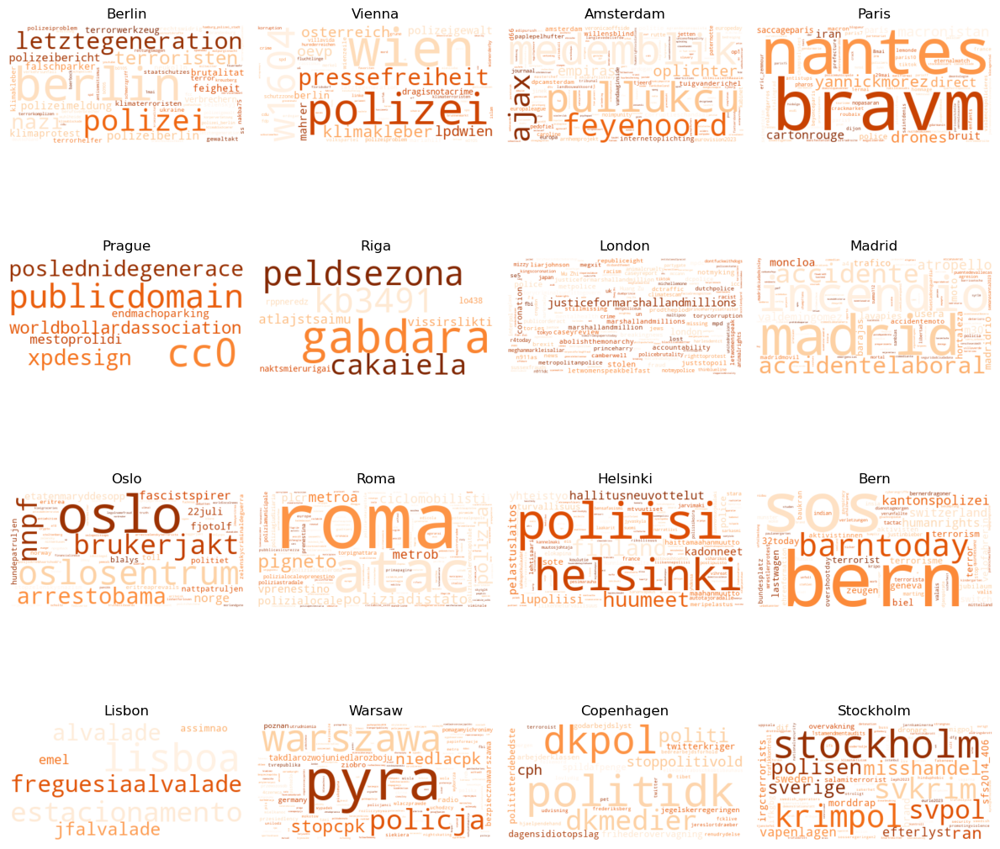

In [231]:
# plot wordcloud for search
fig, axs = plt.subplots(4, 4, figsize=(12, 12), subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axs.flat):
    if i >= len(df_hashtags1):
        break
    
    city = df_hashtags1.loc[i, 'City']
    word_counts = df_hashtags1.all_hashtags_search[i]
    
    if len(word_counts) == 0:
        # ax.set_title(city)
        ax.set_visible(False)
    else:
        # Generate word cloud
        wordcloud = WordCloud(background_color='white', colormap='Oranges').generate_from_frequencies(word_counts)

        # Plot the word cloud
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.axis("off")
        ax.set_title(city)

plt.tight_layout()

# Save the figure
plt.savefig('hashtags_word_cloud_search.png')

# Show the plot
plt.show()
